In [1]:
import pandas as pd

# Load the dataset
url = 'https://raw.githubusercontent.com/datasets/covid-19/main/data/countries-aggregated.csv'
df = pd.read_csv(url)

In [2]:
print(df.isnull().sum())

Date         0
Country      0
Confirmed    0
Recovered    0
Deaths       0
dtype: int64


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161568 entries, 0 to 161567
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Date       161568 non-null  object
 1   Country    161568 non-null  object
 2   Confirmed  161568 non-null  int64 
 3   Recovered  161568 non-null  int64 
 4   Deaths     161568 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 6.2+ MB
None


In [4]:
df.describe()

,Confirmed,Recovered,Deaths
count,1.615680e+05,1.615680e+05,161568.000000
mean,7.361569e+05,1.453967e+05,13999.436089
std,3.578884e+06,9.748275e+05,59113.581271
min,0.000000e+00,0.000000e+00,0.000000
25%,1.220000e+03,0.000000e+00,17.000000
50%,2.369200e+04,1.260000e+02,365.000000
75%,2.558420e+05,1.797225e+04,4509.000000
max,8.062512e+07,3.097475e+07,988609.000000


In [5]:
df['Date'] = pd.to_datetime(df['Date'])

In [6]:
print(df.head())

        Date      Country  Confirmed  Recovered  Deaths
0 2020-01-22  Afghanistan          0          0       0
1 2020-01-23  Afghanistan          0          0       0
2 2020-01-24  Afghanistan          0          0       0
3 2020-01-25  Afghanistan          0          0       0
4 2020-01-26  Afghanistan          0          0       0


## 3. Visualise global trends

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore") 

In [8]:
global_trends = df.groupby('Date').sum()

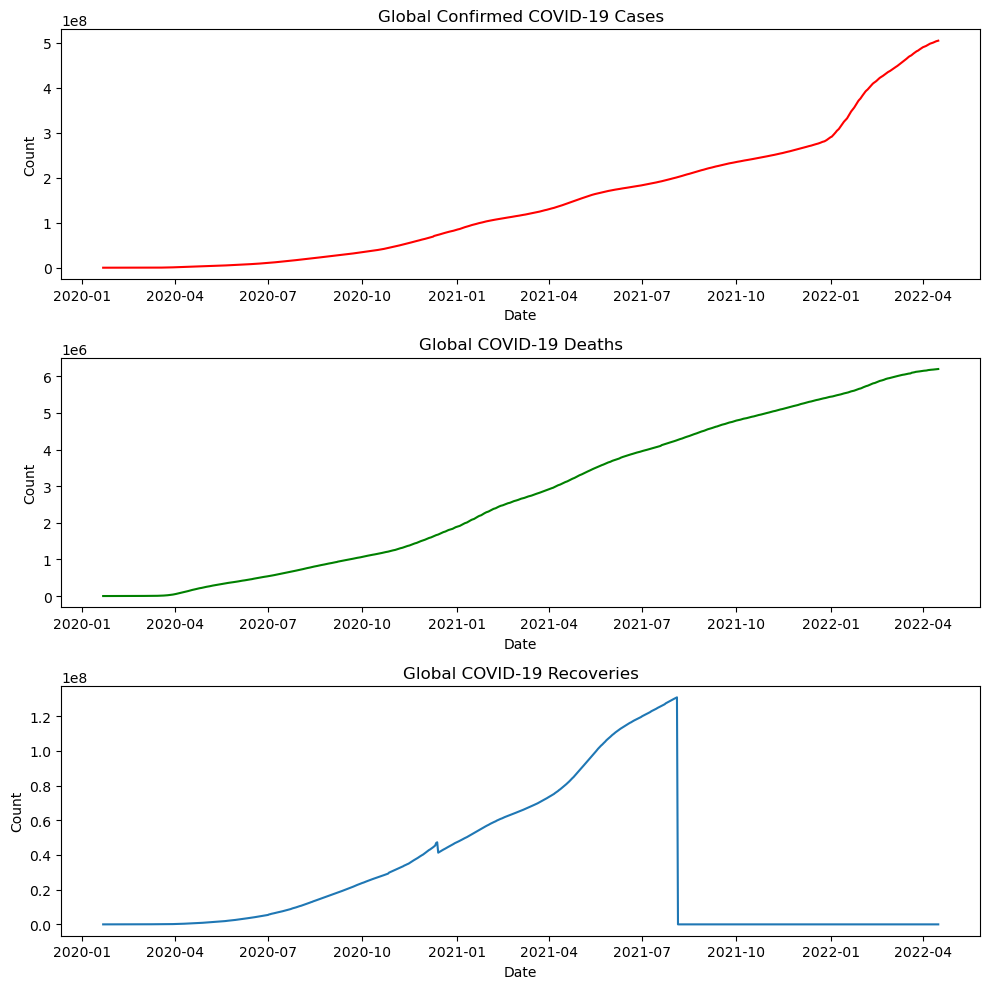

In [9]:
fig, axes = plt.subplots(3, 1, figsize=(10, 10))

# Plot the total number of confirmed cases over time
sns.lineplot(data=global_trends['Confirmed'], ax=axes[0], color = 'red')
axes[0].set_title('Global Confirmed COVID-19 Cases')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Count')

# Plot the total number of deaths over time
sns.lineplot(data=global_trends['Deaths'], ax=axes[1], color = 'green')
axes[1].set_title('Global COVID-19 Deaths')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Count')

# Plot the total number of recoveries over time
sns.lineplot(data=global_trends['Recovered'], ax=axes[2])
axes[2].set_title('Global COVID-19 Recoveries')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Count')

# Adjust layout to make room for titles
plt.tight_layout()

# Show the plots
plt.show()

### 4. Countries comparison

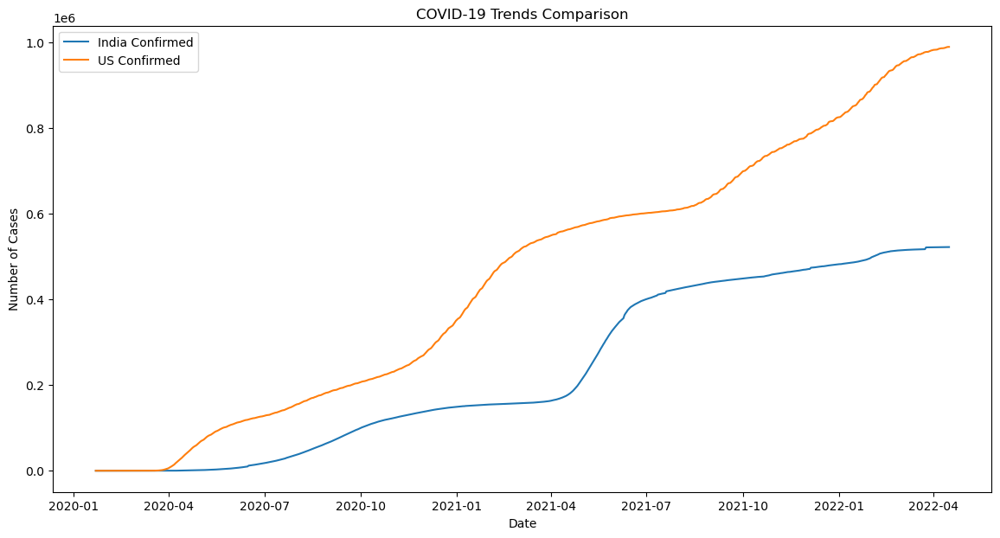

In [10]:
def compare_countries_trends(countries):
    plt.figure(figsize=(14, 7))
    for country in countries:
        country_data = df[df['Country'] == country]
        plt.plot(country_data['Date'], country_data['Deaths'], label=f'{country} Confirmed')
    plt.xlabel('Date')
    plt.ylabel('Number of Cases')
    plt.title('COVID-19 Trends Comparison')
    plt.legend()
    plt.show()

# Example usage
compare_countries_trends(['India', 'US'])


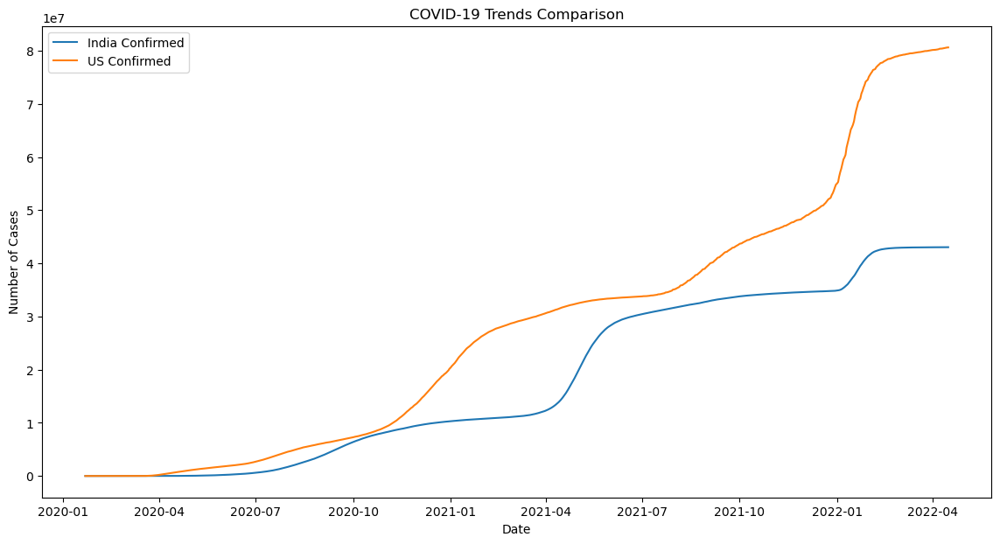

In [11]:
def compare_countries_trends(countries):
    plt.figure(figsize=(14, 7))
    for country in countries:
        country_data = df[df['Country'] == country]
        plt.plot(country_data['Date'], country_data['Confirmed'], label=f'{country} Confirmed')
    plt.xlabel('Date')
    plt.ylabel('Number of Cases')
    plt.title('COVID-19 Trends Comparison')
    plt.legend()
    plt.show()

# Example usage
compare_countries_trends(['India', 'US'])


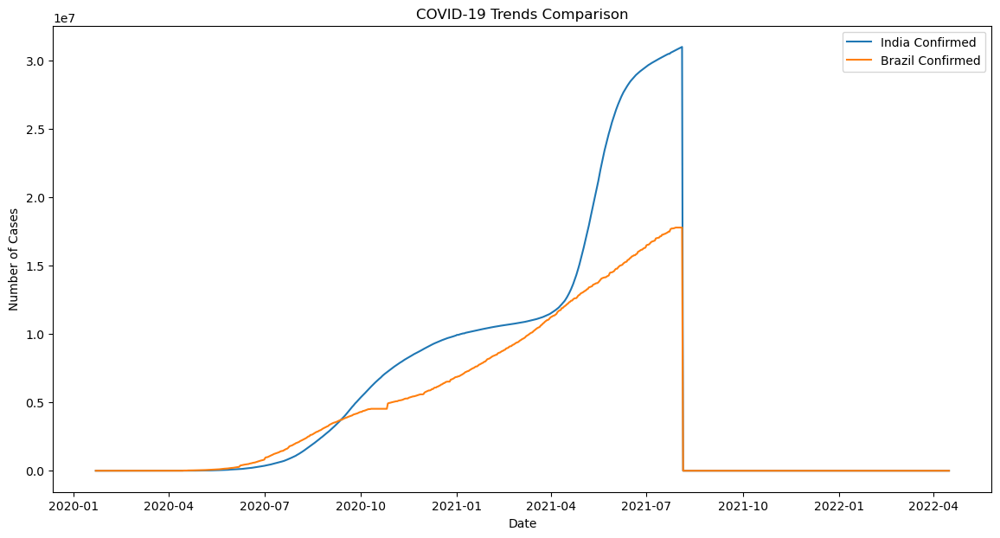

In [12]:
def compare_countries_trends(countries):
    plt.figure(figsize=(14, 7))
    for country in countries:
        country_data = df[df['Country'] == country]
        plt.plot(country_data['Date'], country_data['Recovered'], label=f'{country} Confirmed')
    plt.xlabel('Date')
    plt.ylabel('Number of Cases')
    plt.title('COVID-19 Trends Comparison')
    plt.legend()
    plt.show()

# Example usage
compare_countries_trends(['India', 'Brazil'])


### 5. Comparative Analysis

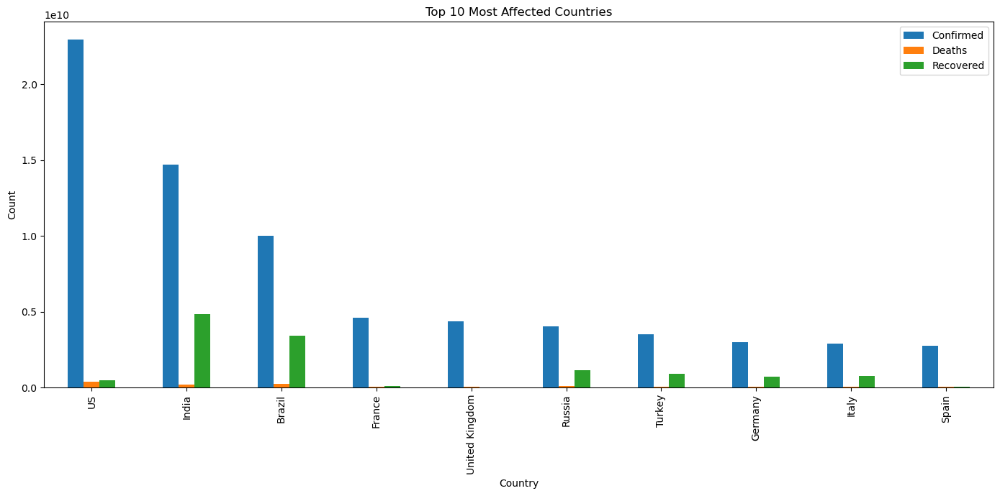

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_comparative_analysis():
    url = 'https://raw.githubusercontent.com/datasets/covid-19/main/data/countries-aggregated.csv'
    df = pd.read_csv(url)
    df['Date'] = pd.to_datetime(df['Date'])

    # Exclude the datetime column when performing the sum operation
    country_totals = df.groupby('Country')[['Confirmed', 'Deaths', 'Recovered']].sum()

    # Top 10 most affected countries by confirmed cases
    top_10_countries = country_totals.sort_values('Confirmed', ascending=False).head(10)

    # Plot bar plots for total number of confirmed cases, deaths, and recoveries
    fig, ax = plt.subplots(figsize=(14, 7))
    top_10_countries[['Confirmed', 'Deaths', 'Recovered']].plot(kind='bar', ax=ax)
    ax.set_title('Top 10 Most Affected Countries')
    ax.set_xlabel('Country')
    ax.set_ylabel('Count')
    fig.tight_layout()

if __name__ == "__main__":
    plot_comparative_analysis()


In [14]:
global_data = df.groupby('Date').sum().reset_index()

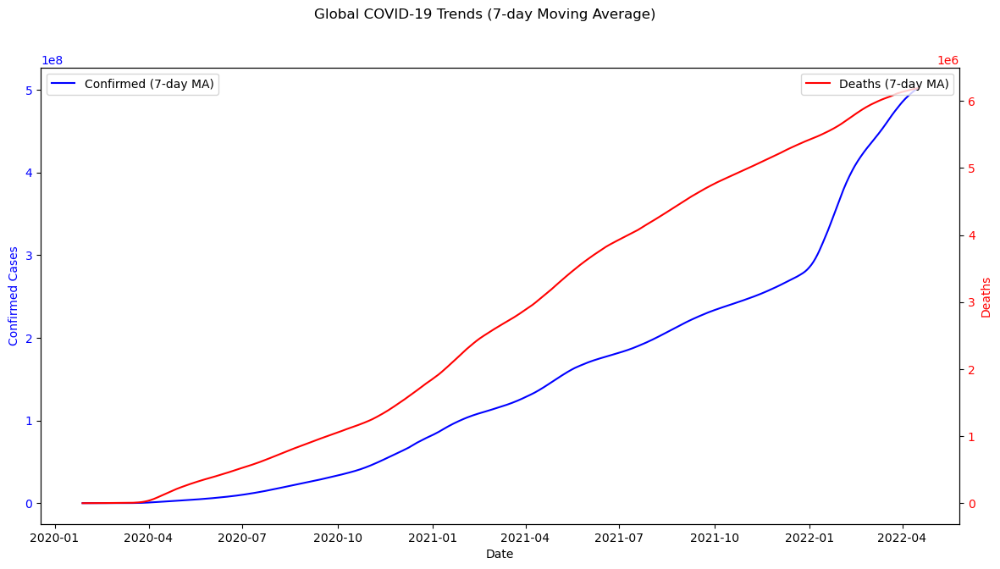

In [15]:
# Compute the moving average for global data
global_data['Confirmed_MA'] = global_data['Confirmed'].rolling(window=7).mean()
global_data['Deaths_MA'] = global_data['Deaths'].rolling(window=7).mean()

# Plot the moving averages with secondary y-axis for deaths
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot confirmed cases on primary y-axis
ax1.plot(global_data['Date'], global_data['Confirmed_MA'], color='b', label='Confirmed (7-day MA)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Confirmed Cases', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create secondary y-axis for deaths
ax2 = ax1.twinx()
ax2.plot(global_data['Date'], global_data['Deaths_MA'], color='r', label='Deaths (7-day MA)')
ax2.set_ylabel('Deaths', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Add title and legends
fig.suptitle('Global COVID-19 Trends (7-day Moving Average)')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()


### 6. Correlation matrix

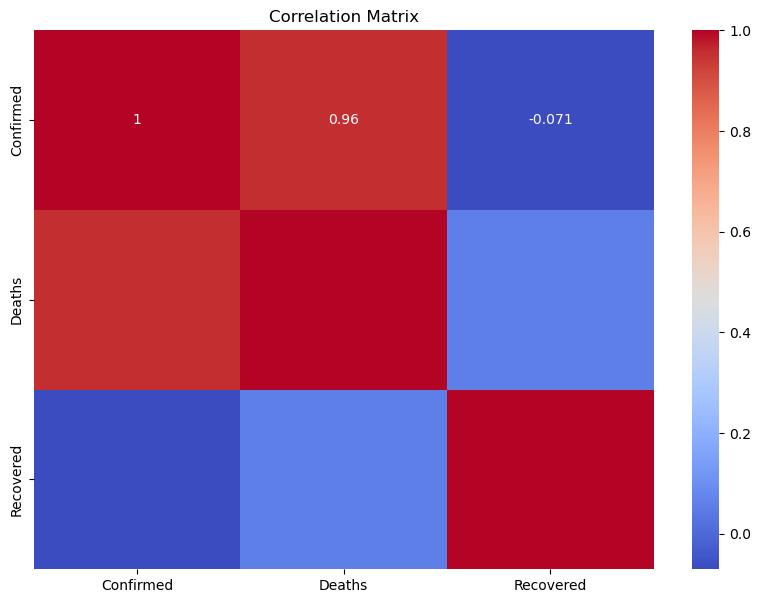

Correlation between Confirmed Cases and Deaths: 0.96


In [16]:
# Calculate the correlation matrix
correlation_matrix = global_trends[['Confirmed', 'Deaths', 'Recovered']].corr()

plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

confirmed_deaths_correlation = correlation_matrix.loc['Confirmed', 'Deaths']
print(f"Correlation between Confirmed Cases and Deaths: {confirmed_deaths_correlation:.2f}")

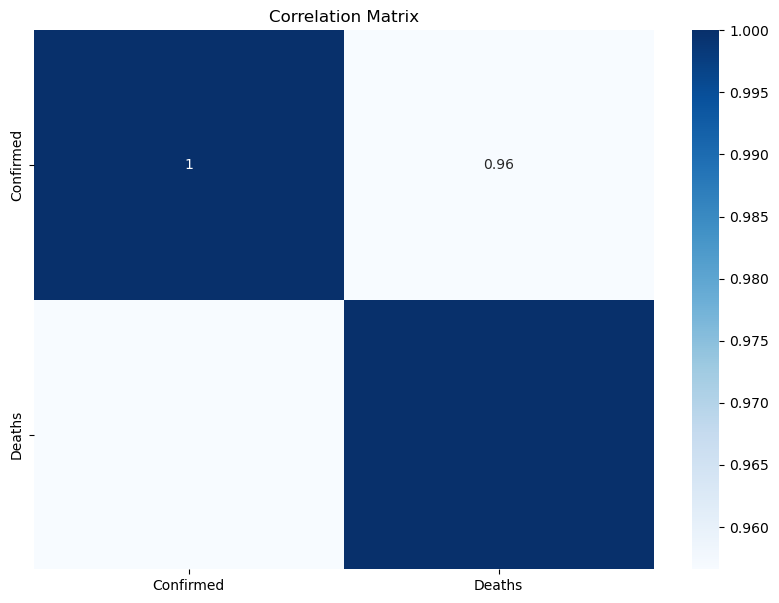

In [17]:
# Calculate the correlation matrix
correlation_matrix = global_trends[['Confirmed', 'Deaths']].corr()

plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues')
plt.title('Correlation Matrix')
plt.show()

# Covid-19 Data Analysis, Part-2 Answer following questions visually through data:

1. What is the trend of confirmed cases, deaths, and recoveries globally over time? Draw 
plots separately.
2. Which country has the highest number of confirmed cases, deaths, and recoveries as 
of the latest date in the dataset?
3. How do the trends of confirmed cases differ between the top 5 most affected 
countries?
4. What is the growth rate of confirmed cases, deaths, and recoveries globally?
5. What are the cumulative confirmed cases, deaths, and recoveries for the top 10 most 
affected countries?
6. How does the recovery rate compare across different countries?
7. What is the correlation between confirmed cases, deaths, and recoveries globally?
8. How do lockdown measures impact the trend of confirmed cases in different 
countries?
9. How does the number of tests conducted relate to the number of confirmed cases in 
various countries?
10. What is the distribution of confirmed cases, deaths, and recoveries by continent

## 1. What is the trend of confirmed cases, deaths, and recoveries globally over time? Draw plots separately.

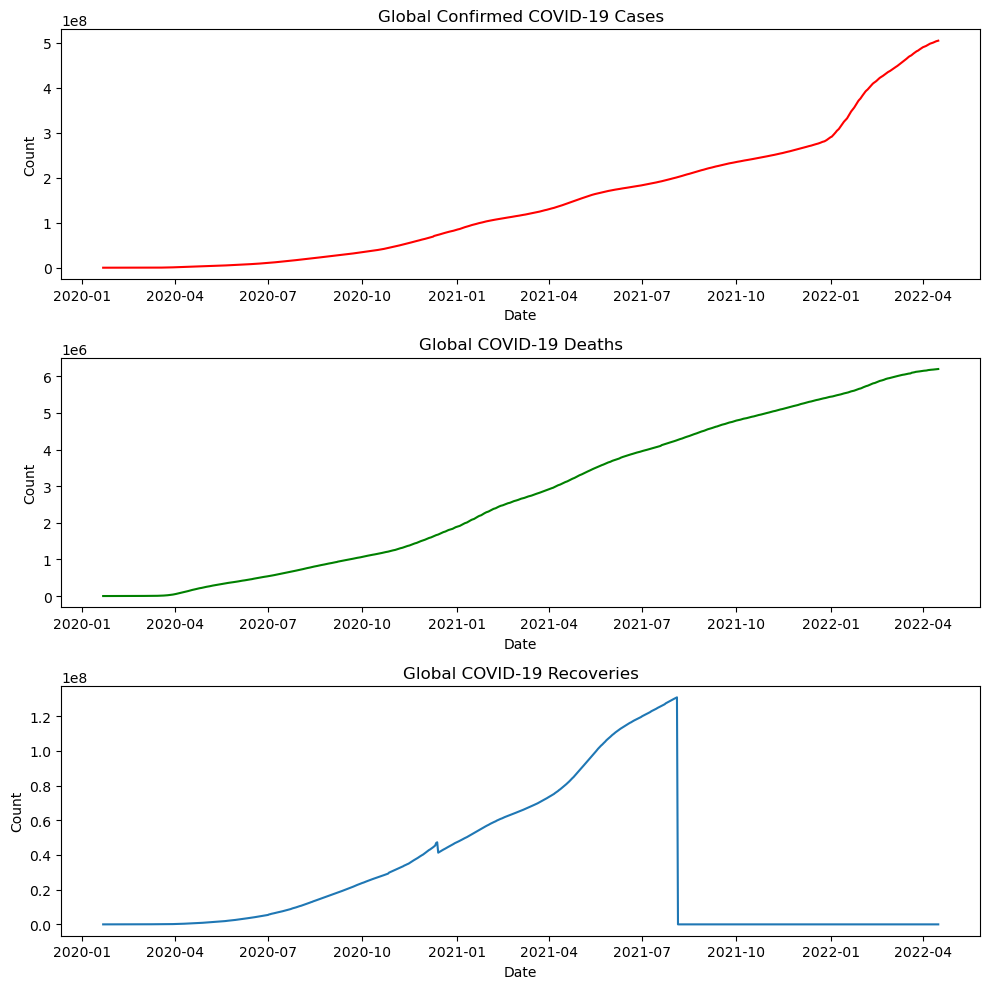

In [18]:
fig, axes = plt.subplots(3, 1, figsize=(10, 10))

# Plot the total number of confirmed cases over time
sns.lineplot(data=global_trends['Confirmed'], ax=axes[0], color = 'red')
axes[0].set_title('Global Confirmed COVID-19 Cases')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Count')

# Plot the total number of deaths over time
sns.lineplot(data=global_trends['Deaths'], ax=axes[1], color = 'green')
axes[1].set_title('Global COVID-19 Deaths')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Count')

# Plot the total number of recoveries over time
sns.lineplot(data=global_trends['Recovered'], ax=axes[2])
axes[2].set_title('Global COVID-19 Recoveries')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Count')

# Adjust layout to make room for titles
plt.tight_layout()

# Show the plots
plt.show()

## 2. Which country has the highest number of confirmed cases, deaths, and recoveries as of the latest date in the dataset?

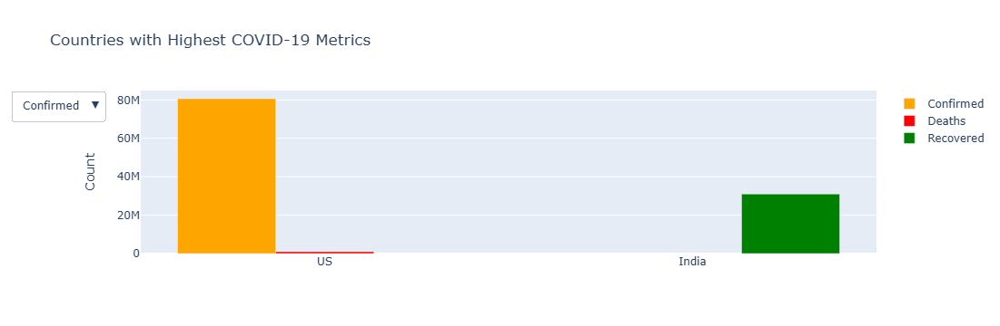

In [19]:
import plotly.graph_objects as go
# Filter data for recovered metric until 2021-08-05
recovered_cutoff_date = '2021-08-05'
df_recovered = df[df['Date'] < recovered_cutoff_date]

# Find the latest date for each metric and filter data for those dates
latest_date = df['Date'].max()
latest_data = df[df['Date'] == latest_date]

latest_date_recovered = df_recovered['Date'].max()
latest_data_recovered = df_recovered[df_recovered['Date'] == latest_date_recovered]

# Identify the countries with the highest confirmed cases, deaths, and recoveries
highest_confirmed_country = latest_data.loc[latest_data['Confirmed'].idxmax()]['Country']
highest_confirmed_count = latest_data['Confirmed'].max()

highest_deaths_country = latest_data.loc[latest_data['Deaths'].idxmax()]['Country']
highest_deaths_count = latest_data['Deaths'].max()

highest_recoveries_country = latest_data_recovered.loc[latest_data_recovered['Recovered'].idxmax()]['Country']
highest_recoveries_count = latest_data_recovered['Recovered'].max()

# Prepare data for Plotly
metrics = ['Confirmed', 'Deaths', 'Recovered']
countries = [highest_confirmed_country, highest_deaths_country, highest_recoveries_country]
counts = [highest_confirmed_count, highest_deaths_count, highest_recoveries_count]

# Create initial bar chart
fig = go.Figure()

# Add traces for each metric
fig.add_trace(go.Bar(
    x=[highest_confirmed_country],
    y=[highest_confirmed_count],
    name='Confirmed',
    marker_color='orange'
))

fig.add_trace(go.Bar(
    x=[highest_deaths_country],
    y=[highest_deaths_count],
    name='Deaths',
    marker_color='red'
))

fig.add_trace(go.Bar(
    x=[highest_recoveries_country],
    y=[highest_recoveries_count],
    name='Recovered',
    marker_color='green'
))

# Update layout for dropdown menu
fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=[{'visible': [True, False, False]}],
                    label='Confirmed',
                    method='update'
                ),
                dict(
                    args=[{'visible': [False, True, False]}],
                    label='Deaths',
                    method='update'
                ),
                dict(
                    args=[{'visible': [False, False, True]}],
                    label='Recovered',
                    method='update'
                ),
                dict(
                    args=[{'visible': [True, True, True]}],
                    label='All',
                    method='update'
                )
            ]),
            direction='down',
            showactive=True,
        )
    ]
)

# Set title and axis labels
fig.update_layout(
    title='Countries with Highest COVID-19 Metrics',
    yaxis=dict(title='Count'),
    barmode='group'
)

# Show the plot
fig.show()

## 3. How do the trends of confirmed cases differ between the top 5 most affected countries?

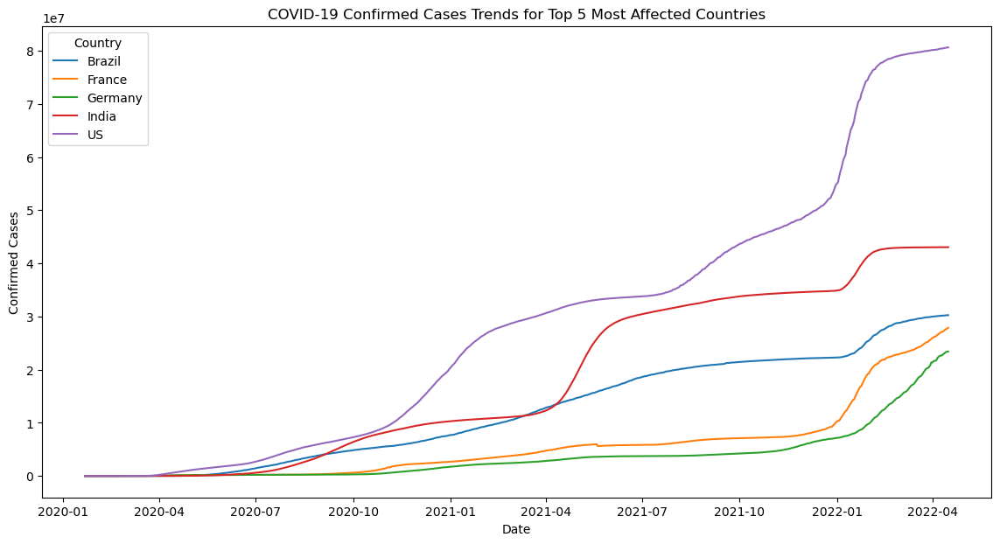

In [20]:
# Find the latest date in the dataset
latest_date = df['Date'].max()

# Filter the data for the latest date
latest_data = df[df['Date'] == latest_date]

# Find the top 5 countries with the highest number of confirmed cases
top_5_countries = latest_data.nlargest(5, 'Confirmed')['Country']

# Filter the original dataframe for the top 5 countries
top_5_data = df[df['Country'].isin(top_5_countries)]

# Plot the trends of confirmed cases for the top 5 countries
plt.figure(figsize=(14, 7))
sns.lineplot(data=top_5_data, x='Date', y='Confirmed', hue='Country')
plt.title('COVID-19 Confirmed Cases Trends for Top 5 Most Affected Countries')
plt.xlabel('Date')
plt.ylabel('Confirmed Cases')
plt.legend(title='Country')
plt.show()


## 4. What is the growth rate of confirmed cases, deaths, and recoveries globally?

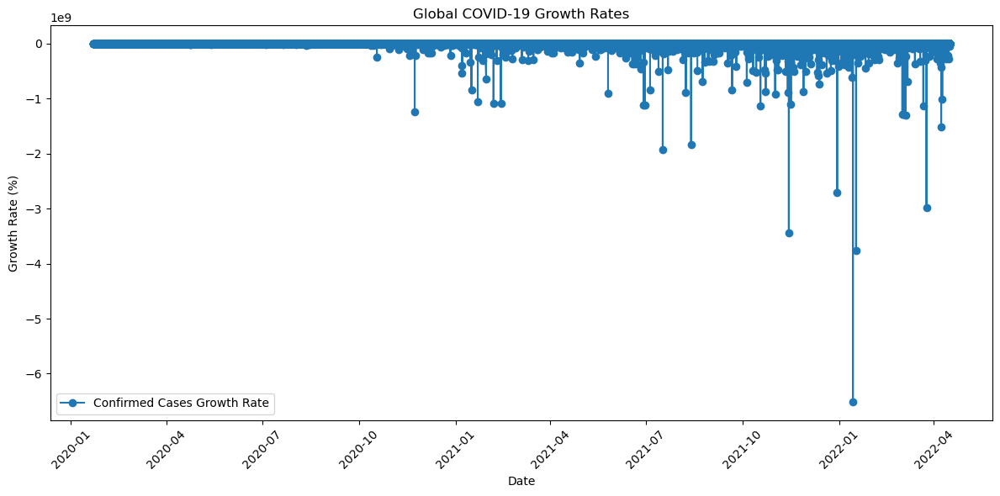

In [21]:
# Sort dataframe by Date
df = df.sort_values(by='Date')

df['NewConfirmed'] = df['Confirmed'].diff()
df['NewDeaths'] = df['Deaths'].diff()
df['NewRecovered'] = df['Recovered'].diff()

df['Confirmed_growth_rate'] = df['NewConfirmed'] / df['Confirmed'] * 100
df['Deaths_growth_rate'] = df['NewDeaths'] / df['Deaths'] * 100
df['Recovered_growth_rate'] = df['NewRecovered'] / df['Recovered'] * 100

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(df['Date'], df['Confirmed_growth_rate'], label='Confirmed Cases Growth Rate', marker='o', linestyle='-')

ax.set_xlabel('Date')
ax.set_ylabel('Growth Rate (%)')
ax.set_title('Global COVID-19 Growth Rates')
ax.legend()

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

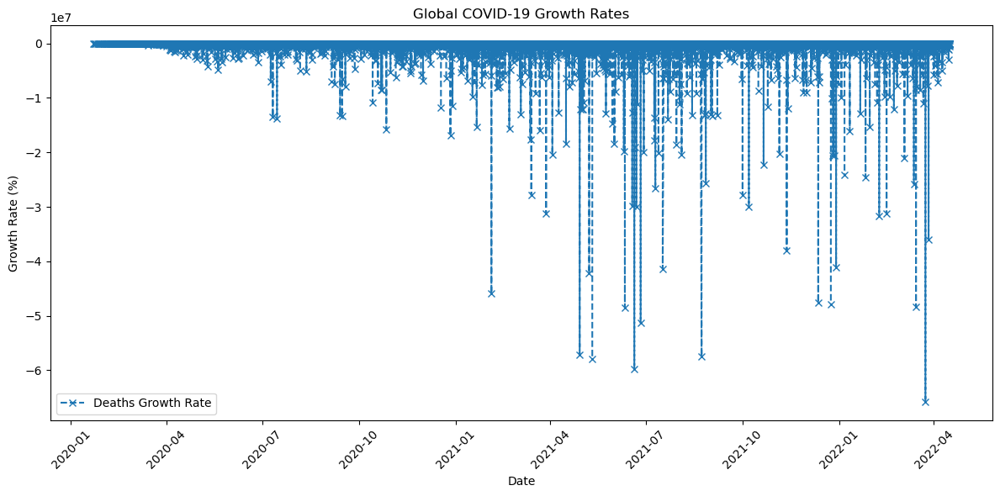

In [22]:
# Sort dataframe by Date
df = df.sort_values(by='Date')

df['NewConfirmed'] = df['Confirmed'].diff()
df['NewDeaths'] = df['Deaths'].diff()
df['NewRecovered'] = df['Recovered'].diff()

df['Confirmed_growth_rate'] = df['NewConfirmed'] / df['Confirmed'] * 100
df['Deaths_growth_rate'] = df['NewDeaths'] / df['Deaths'] * 100
df['Recovered_growth_rate'] = df['NewRecovered'] / df['Recovered'] * 100

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(df['Date'], df['Deaths_growth_rate'], label='Deaths Growth Rate', marker='x', linestyle='--')

ax.set_xlabel('Date')
ax.set_ylabel('Growth Rate (%)')
ax.set_title('Global COVID-19 Growth Rates')
ax.legend()

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

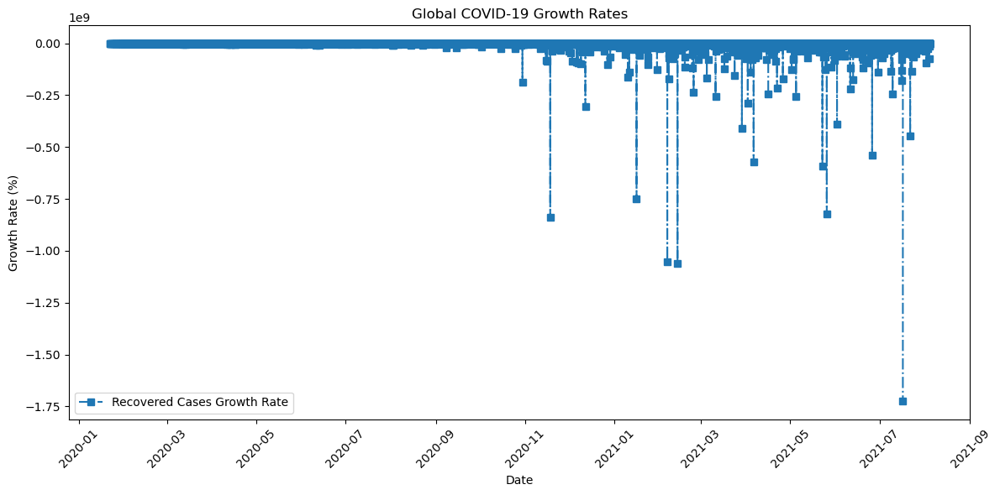

In [23]:
# Sort dataframe by Date
df = df.sort_values(by='Date')

df['NewConfirmed'] = df['Confirmed'].diff()
df['NewDeaths'] = df['Deaths'].diff()
df['NewRecovered'] = df['Recovered'].diff()

df['Confirmed_growth_rate'] = df['NewConfirmed'] / df['Confirmed'] * 100
df['Deaths_growth_rate'] = df['NewDeaths'] / df['Deaths'] * 100
df['Recovered_growth_rate'] = df['NewRecovered'] / df['Recovered'] * 100

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(df['Date'], df['Recovered_growth_rate'], label='Recovered Cases Growth Rate', marker='s', linestyle='-.')

ax.set_xlabel('Date')
ax.set_ylabel('Growth Rate (%)')
ax.set_title('Global COVID-19 Growth Rates')
ax.legend()

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## 5. What are the cumulative confirmed cases, deaths, and recoveries for the top 10 most affected countries?

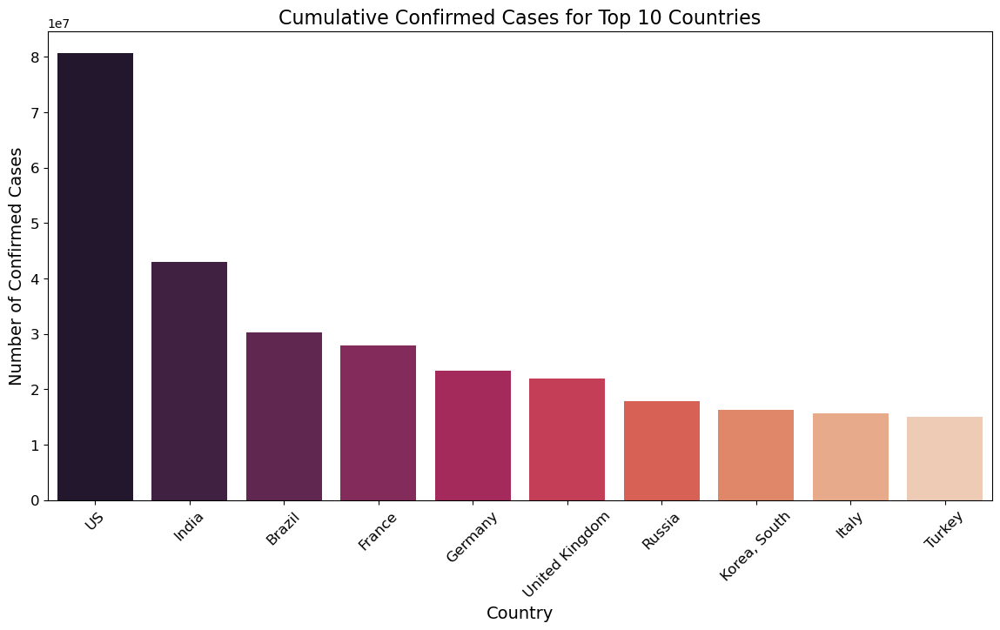

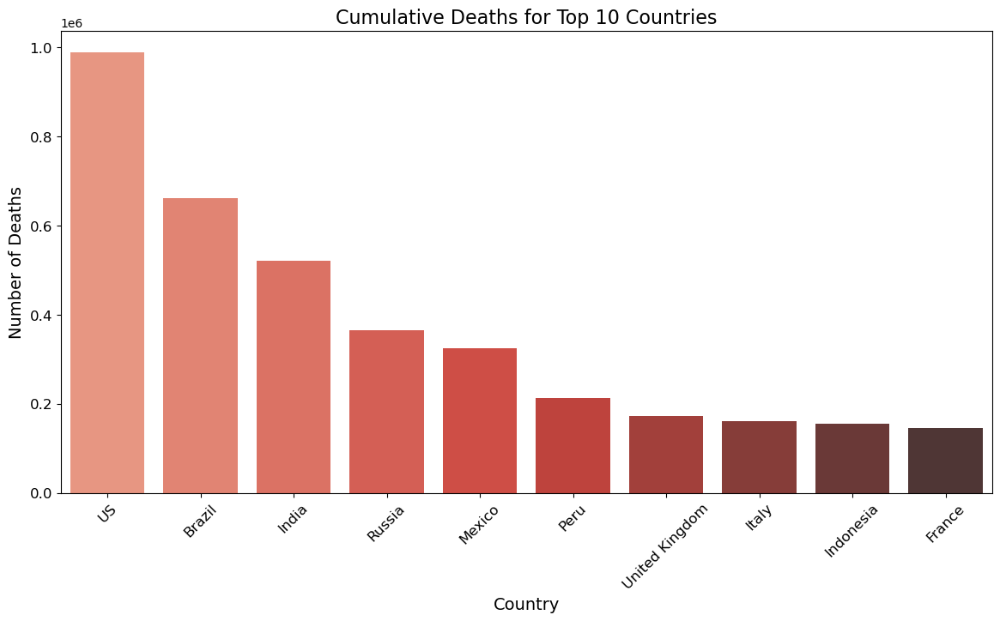

<Figure size 1400x700 with 0 Axes>

<Figure size 1400x700 with 0 Axes>

In [24]:
top_10_countries = latest_data.sort_values(by='Confirmed',ascending=False).head(10)

plt.figure(figsize=(14, 7))
sns.barplot(data=top_10_countries, x='Country', y='Confirmed', palette='rocket')
plt.title('Cumulative Confirmed Cases for Top 10 Countries', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Number of Confirmed Cases', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.show()

top_10_countries = latest_data.sort_values(by='Deaths',ascending=False).head(10)
plt.figure(figsize=(14, 7))
sns.barplot(data=top_10_countries, x='Country', y='Deaths', palette='Reds_d')
plt.title('Cumulative Deaths for Top 10 Countries', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Number of Deaths', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)
plt.show()
plt.figure(figsize=(14, 7))

## 6. How does the recovery rate compare across different countries?

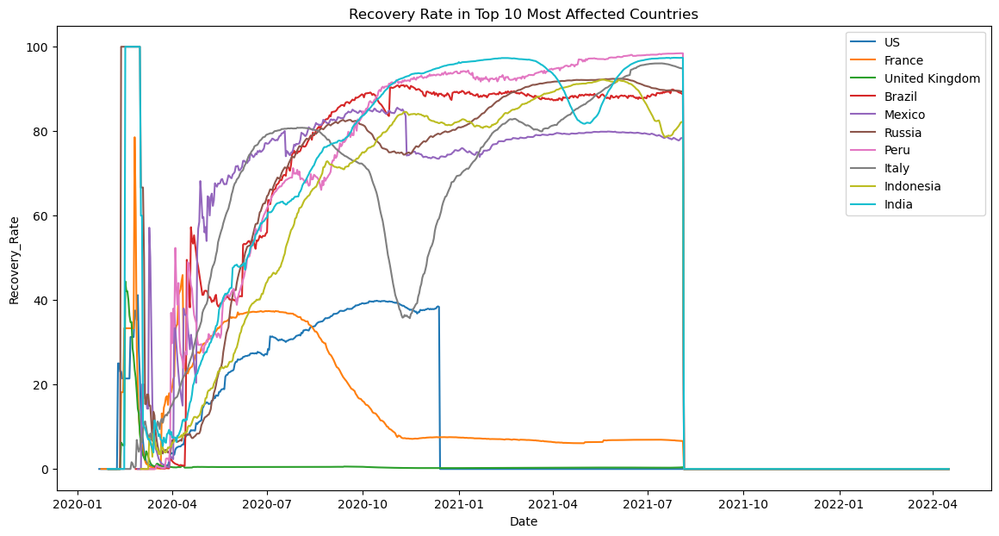

In [25]:
# Recovery rate calculation
df['Recovery_Rate'] = (df['Recovered'] / df['Confirmed']) * 100

# Plotting recovery rate for top 10 most affected countries
top_10_recovery = df[df['Country'].isin(top_10_countries['Country'])]

plt.figure(figsize=(14, 7))
sns.lineplot(data=top_10_recovery, x='Date', y='Recovery_Rate', hue='Country')
plt.title('Recovery Rate in Top 10 Most Affected Countries')
plt.legend()
plt.show()


In [26]:
country_to_continent = {
    # North America
    'Antigua and Barbuda': 'North America', 'Bahamas': 'North America', 'Barbados': 'North America',
    'Belize': 'North America', 'Canada': 'North America', 'Costa Rica': 'North America',
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America',
    'El Salvador': 'North America', 'Grenada': 'North America', 'Guatemala': 'North America',
    'Haiti': 'North America', 'Honduras': 'North America', 'Jamaica': 'North America',
    'Mexico': 'North America', 'Nicaragua': 'North America', 'Panama': 'North America',
    'Saint Kitts and Nevis': 'North America', 'Saint Lucia': 'North America', 'Saint Vincent and the Grenadines': 'North America',
    'Trinidad and Tobago': 'North America', 'United States': 'North America',
    # South America
    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America',
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America',
    'Guyana': 'South America', 'Paraguay': 'South America', 'Peru': 'South America',
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America',
    # Europe
    'Albania': 'Europe', 'Andorra': 'Europe', 'Armenia': 'Europe', 'Austria': 'Europe',
    'Azerbaijan': 'Europe', 'Belarus': 'Europe', 'Belgium': 'Europe', 'Bosnia and Herzegovina': 'Europe',
    'Bulgaria': 'Europe', 'Croatia': 'Europe', 'Cyprus': 'Europe', 'Czech Republic': 'Europe',
    'Denmark': 'Europe', 'Estonia': 'Europe', 'Finland': 'Europe', 'France': 'Europe',
    'Georgia': 'Europe', 'Germany': 'Europe', 'Greece': 'Europe', 'Hungary': 'Europe',
    'Iceland': 'Europe', 'Ireland': 'Europe', 'Italy': 'Europe', 'Kazakhstan': 'Europe',
    'Kosovo': 'Europe', 'Latvia': 'Europe', 'Liechtenstein': 'Europe', 'Lithuania': 'Europe',
    'Luxembourg': 'Europe', 'Malta': 'Europe', 'Moldova': 'Europe', 'Monaco': 'Europe',
    'Montenegro': 'Europe', 'Netherlands': 'Europe', 'North Macedonia': 'Europe', 'Norway': 'Europe',
    'Poland': 'Europe', 'Portugal': 'Europe', 'Romania': 'Europe', 'Russia': 'Europe',
    'San Marino': 'Europe', 'Serbia': 'Europe', 'Slovakia': 'Europe', 'Slovenia': 'Europe',
    'Spain': 'Europe', 'Sweden': 'Europe', 'Switzerland': 'Europe', 'Turkey': 'Europe',
    'Ukraine': 'Europe', 'United Kingdom': 'Europe', 'Vatican City': 'Europe',
    # Africa
    'Algeria': 'Africa', 'Angola': 'Africa', 'Benin': 'Africa', 'Botswana': 'Africa',
    'Burkina Faso': 'Africa', 'Burundi': 'Africa', 'Cabo Verde': 'Africa', 'Cameroon': 'Africa',
    'Central African Republic': 'Africa', 'Chad': 'Africa', 'Comoros': 'Africa', 'Congo, Democratic Republic of the': 'Africa',
    'Congo, Republic of the': 'Africa', 'Djibouti': 'Africa', 'Egypt': 'Africa', 'Equatorial Guinea': 'Africa',
    'Eritrea': 'Africa', 'Eswatini': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa',
    'Gambia': 'Africa', 'Ghana': 'Africa', 'Guinea': 'Africa', 'Guinea-Bissau': 'Africa',
    'Ivory Coast': 'Africa', 'Kenya': 'Africa', 'Lesotho': 'Africa', 'Liberia': 'Africa',
    'Libya': 'Africa', 'Madagascar': 'Africa', 'Malawi': 'Africa', 'Mali': 'Africa',
    'Mauritania': 'Africa', 'Mauritius': 'Africa', 'Morocco': 'Africa', 'Mozambique': 'Africa',
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Rwanda': 'Africa',
    'Sao Tome and Principe': 'Africa', 'Senegal': 'Africa', 'Seychelles': 'Africa', 'Sierra Leone': 'Africa',
    'Somalia': 'Africa', 'South Africa': 'Africa', 'South Sudan': 'Africa', 'Sudan': 'Africa',
    'Tanzania': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 'Uganda': 'Africa',
    'Zambia': 'Africa', 'Zimbabwe': 'Africa',
    # Asia
    'Afghanistan': 'Asia', 'Armenia': 'Asia', 'Azerbaijan': 'Asia', 'Bahrain': 'Asia',
    'Bangladesh': 'Asia', 'Bhutan': 'Asia', 'Brunei': 'Asia', 'Cambodia': 'Asia',
    'China': 'Asia', 'Cyprus': 'Asia', 'Georgia': 'Asia', 'India': 'Asia',
    'Indonesia': 'Asia', 'Iran': 'Asia', 'Iraq': 'Asia', 'Israel': 'Asia',
    'Japan': 'Asia', 'Jordan': 'Asia', 'Kazakhstan': 'Asia', 'Kuwait': 'Asia',
    'Kyrgyzstan': 'Asia', 'Laos': 'Asia', 'Lebanon': 'Asia', 'Malaysia': 'Asia',
    'Maldives': 'Asia', 'Mongolia': 'Asia', 'Myanmar': 'Asia', 'Nepal': 'Asia',
    'North Korea': 'Asia', 'Oman': 'Asia', 'Pakistan': 'Asia', 'Palestine': 'Asia',
    'Philippines': 'Asia', 'Qatar': 'Asia', 'Saudi Arabia': 'Asia', 'Singapore': 'Asia',
    'South Korea': 'Asia', 'Sri Lanka': 'Asia', 'Syria': 'Asia', 'Tajikistan': 'Asia',
    'Thailand': 'Asia', 'Timor-Leste': 'Asia', 'Turkey': 'Asia', 'Turkmenistan': 'Asia',
    'United Arab Emirates': 'Asia', 'Uzbekistan': 'Asia', 'Vietnam': 'Asia', 'Yemen': 'Asia',
    # Oceania
    'Australia': 'Oceania', 'Fiji': 'Oceania', 'Kiribati': 'Oceania', 'Marshall Islands': 'Oceania',
    'Micronesia': 'Oceania', 'Nauru': 'Oceania', 'New Zealand': 'Oceania', 'Palau': 'Oceania',
    'Papua New Guinea': 'Oceania', 'Samoa': 'Oceania', 'Solomon Islands': 'Oceania', 'Tonga': 'Oceania',
    'Tuvalu': 'Oceania', 'Vanuatu': 'Oceania'
}


In [27]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px

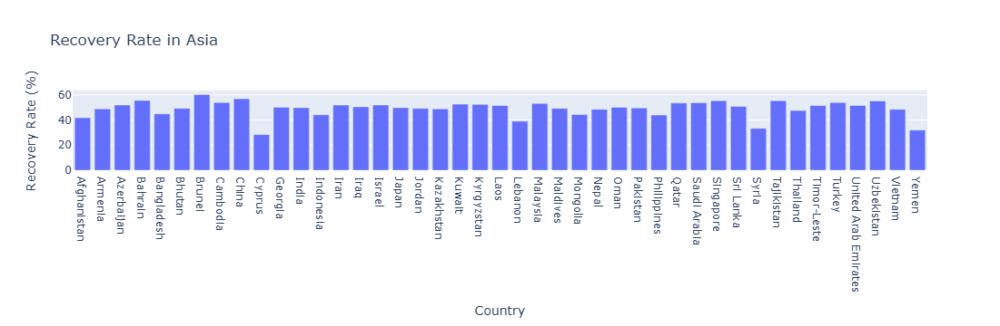

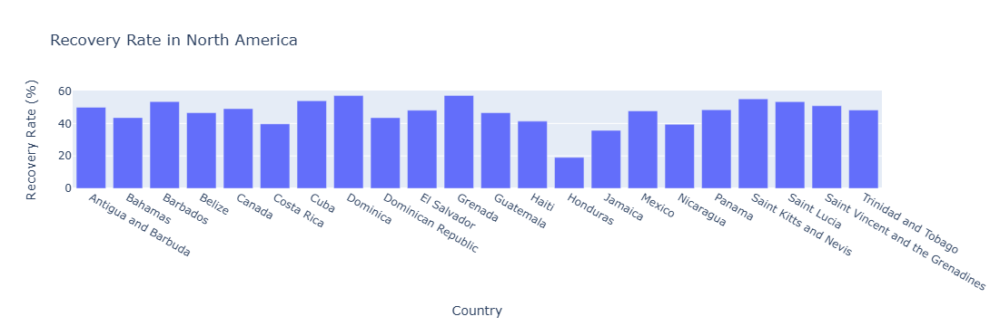

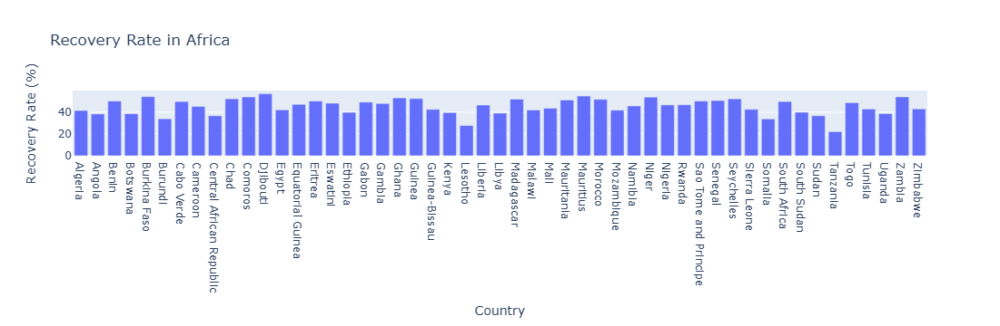

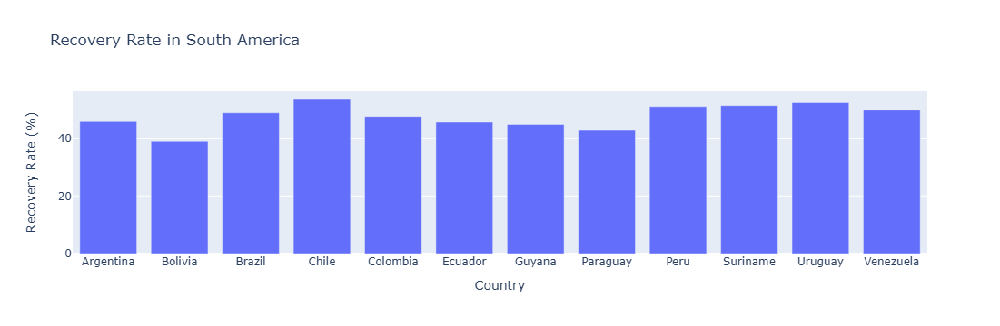

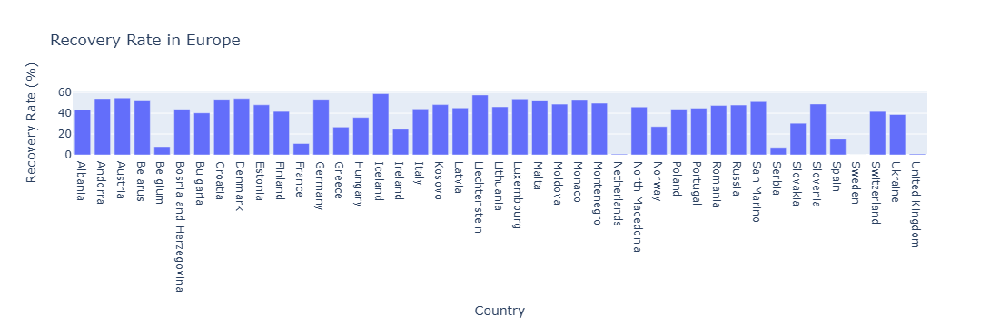

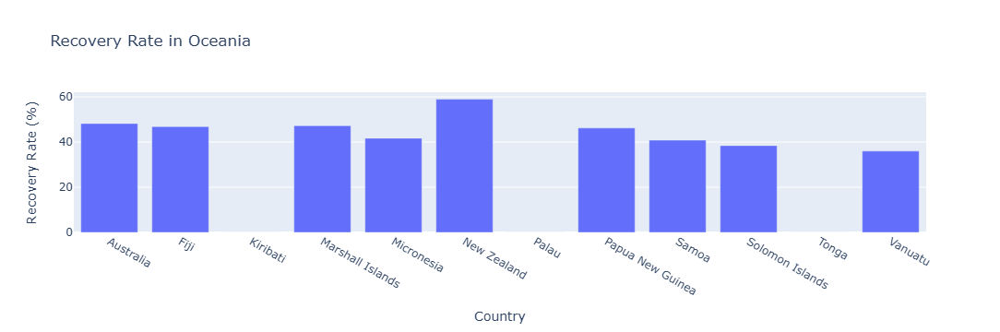

In [28]:
# Adding the 'Continent' column to the DataFrame
df['Continent'] = df['Country'].map(country_to_continent)

# Calculate Recovery Rate
df['Recovery_Rate'] = (df['Recovered'] / df['Confirmed']) * 100

# Get unique continents
continents = df['Continent'].unique()

# Plot bar charts for each continent
for continent in continents:
    if pd.isna(continent):
        continue
    continent_data = df[df['Continent'] == continent]
    latest_data = continent_data.groupby('Country')['Recovery_Rate'].mean().dropna().reset_index()
    
    fig = px.bar(latest_data, x='Country', y='Recovery_Rate', title=f'Recovery Rate in {continent}',
                 hover_data={'Recovery_Rate': ':.2f'}, labels={'Recovery_Rate':'Recovery Rate (%)'})
    fig.show()

## 7. What is the correlation between confirmed cases, deaths, and recoveries globally?

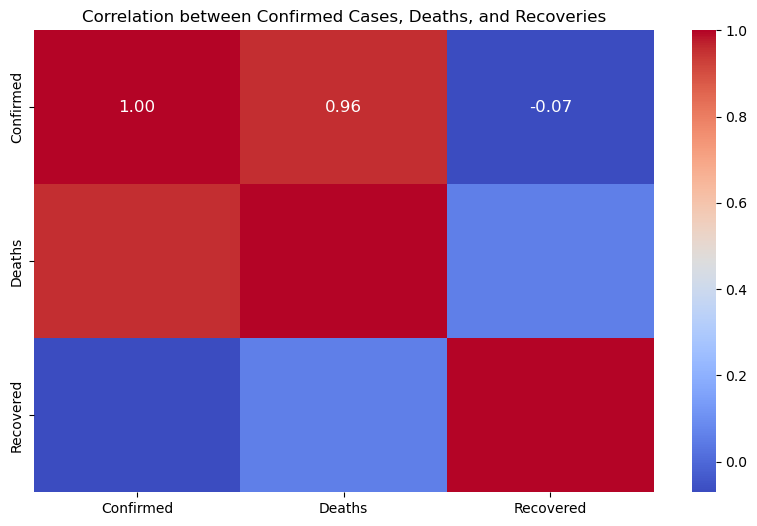

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
correlation_matrix = global_data[['Confirmed', 'Deaths', 'Recovered']].corr()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size':12})
plt.title('Correlation between Confirmed Cases, Deaths, and Recoveries')
plt.show()


## 8. How do lockdown measures impact the trend of confirmed cases in different countries?

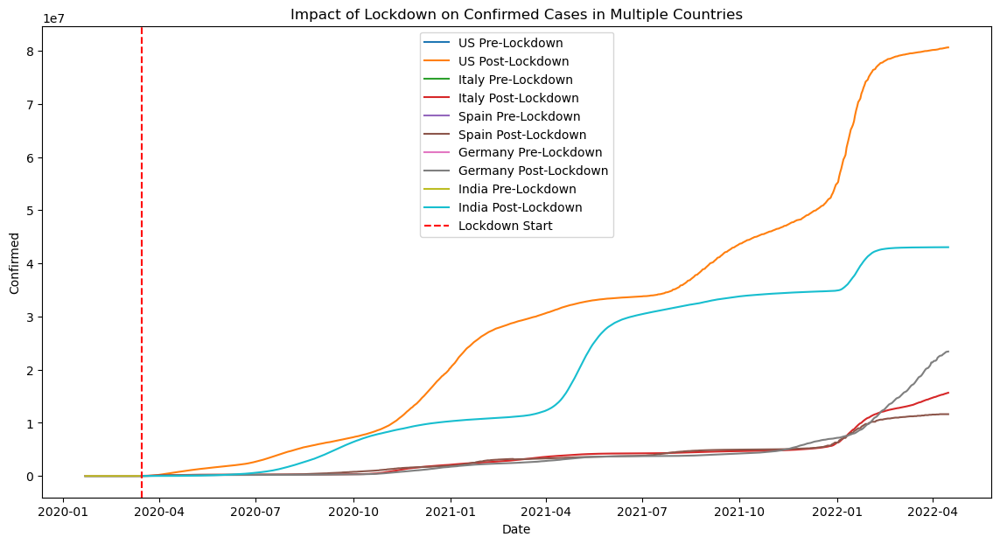

In [30]:
# Assuming the lockdown date is the same globally
lockdown_date = pd.to_datetime('2020-03-15')

# Adding a column to indicate whether the date is before or after lockdown
df['Lockdown'] = df['Date'].apply(lambda x: 'Pre-Lockdown' if x < lockdown_date else 'Post-Lockdown')


# For multiple countries
countries = ['US', 'Italy', 'Spain', 'Germany', "India"]
plt.figure(figsize=(14, 7))
for country in countries:
    country_data = df[df['Country'] == country]
    sns.lineplot(data=country_data[country_data['Lockdown'] == 'Pre-Lockdown'], x='Date', y='Confirmed', label=f'{country} Pre-Lockdown')
    sns.lineplot(data=country_data[country_data['Lockdown'] == 'Post-Lockdown'], x='Date', y='Confirmed', label=f'{country} Post-Lockdown')

plt.axvline(lockdown_date, color='red', linestyle='--', label='Lockdown Start')
plt.title('Impact of Lockdown on Confirmed Cases in Multiple Countries')
plt.legend()
plt.show()


## 9. How does the number of tests conducted relate to the number of confirmed cases in various countries?

The number of tests each day divided by the number of confirmed cases each day.

The series is smoothed by averaging daily figures over a rolling 7-day window.

Not all countries report testing data on a daily basis. To generate this series we assume that testing changed equally on a daily basis over any periods in which no data was reported.

Source
Official data collated by Our World in Data – Last updated 10 April 2024 – processed by Our World in Data

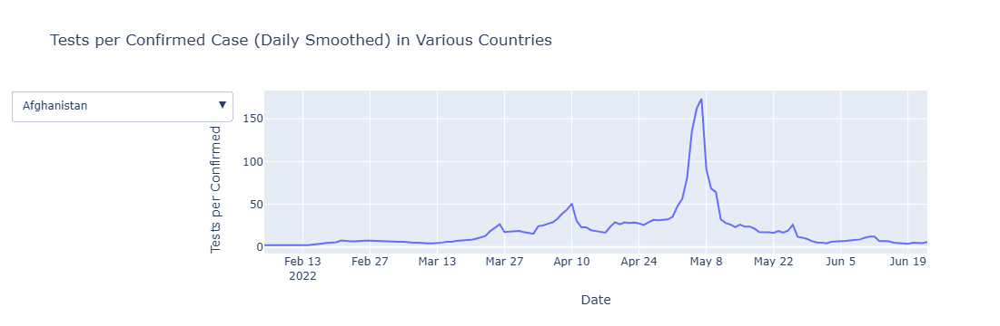

In [31]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Load the data
file_path = "C:/Users/Tanvi Shekhar Sawant/OneDrive/Desktop/Projects/LMS_Internship/Project-4/tests-per-confirmed-case-daily-smoothed.csv"
df1 = pd.read_csv(file_path)

df1['Day'] = pd.to_datetime(df1['Day'], format='%Y-%m-%d')

countries = df1['Entity'].unique()

fig = go.Figure()

for country in countries:
    country_data = df1[df1['Entity'] == country]
    fig.add_trace(go.Scatter(x=country_data['Day'], y=country_data['short_term_tests_per_case'],
                             mode='lines', name=country, visible=False))

fig.data[0].visible = True

dropdown_buttons = []
for i, country in enumerate(countries):
    dropdown_buttons.append(
        dict(
            label=country,
            method="update",
            args=[{"visible": [i == j for j in range(len(countries))]},
                  {"title": f"Tests per Confirmed Case (Daily Smoothed) in {country}"}]
        )
    )

dropdown_buttons.append(
    dict(
        label="Show All",
        method="update",
        args=[{"visible": [True] * len(countries)},
              {"title": "Tests per Confirmed Case (Daily Smoothed) in Various Countries"}]
    )
)

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=dropdown_buttons
        )
    ],
    title="Tests per Confirmed Case (Daily Smoothed) in Various Countries",
    xaxis_title="Date",
    yaxis_title="Tests per Confirmed Case"
)

# Show the plot
fig.show()


## 10. What is the distribution of confirmed cases, deaths, and recoveries by continent

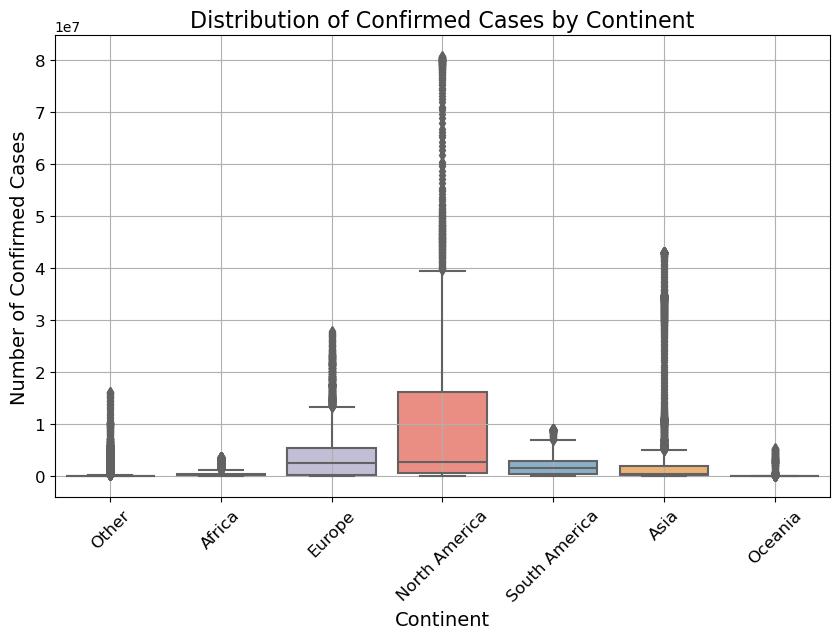

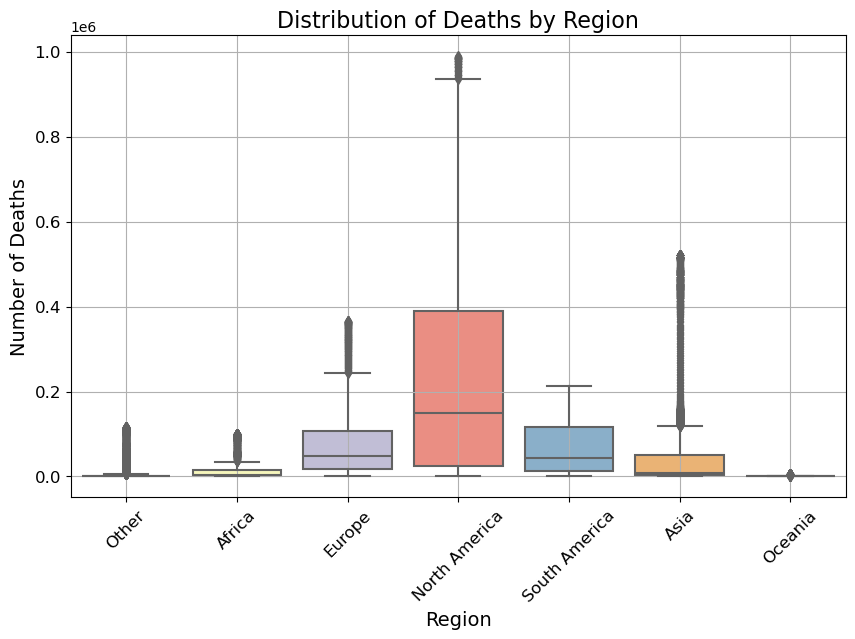

In [32]:
region_mapping = {
 'Europe': ['Germany', 'France', 'Italy', 'Spain', 'United Kingdom', 'Russia', 'Turkey','Netherlands'],
 'Asia': ['China', 'India', 'Pakistan', 'Indonesia', 'Thailand','Vietnam''Japan', 'South Korea', 'Iran', 'Saudi Arabia'],
 'North America': ['US', 'Canada', 'Mexico', 'Brazil'], 
 'Africa': ['South Africa', 'Nigeria', 'Egypt', 'Morocco', 'Kenya'],
 'Oceania': ['Australia', 'New Zealand'],
 'South America': ['Argentina', 'Chile', 'Peru', 'Colombia'],
}

df['Region'] = df['Country'].apply(lambda x: next((region for region, countries in region_mapping.items() if x in countries), 'Other'))

df['Date'] = pd.to_datetime(df['Date'])

region_data = df.groupby('Region').agg({
 'Confirmed': 'sum',
 'Deaths': 'sum',
 'Recovered': 'sum'
}).reset_index()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Region', y='Confirmed', palette='Set3')
plt.title('Distribution of Confirmed Cases by Continent', fontsize=16)
plt.xlabel('Continent', fontsize=14)
plt.ylabel('Number of Confirmed Cases', fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Region', y='Deaths', palette='Set3')
plt.title('Distribution of Deaths by Region', fontsize=16)
plt.xlabel('Region', fontsize=14)
plt.ylabel('Number of Deaths', fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.grid(True)
plt.show()

## Countries with highest confirmed cases as of last date (in dataset)

In [33]:
import pandas as pd
last_date = df['Date'].max()

# Find the data for the last date
last_case_data = df[df['Date'] == last_date]

# Find the country with the last reported case
country_last_case = last_case_data[last_case_data['Confirmed'] > 0]

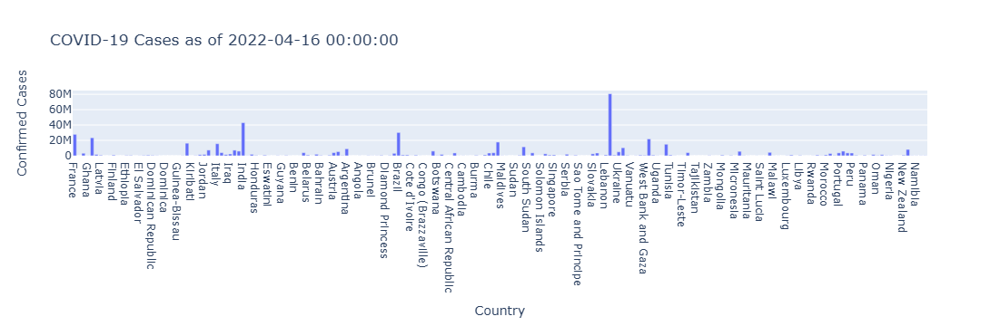

In [34]:
import plotly.express as px

# Filter out countries with reported cases
fig = px.bar(country_last_case, x='Country', y='Confirmed',
             hover_data=['Recovered', 'Deaths'],
             title=f'COVID-19 Cases as of {last_date}')
fig.update_xaxes(title='Country')
fig.update_yaxes(title='Confirmed Cases')
fig.show()


## Mortality Rate

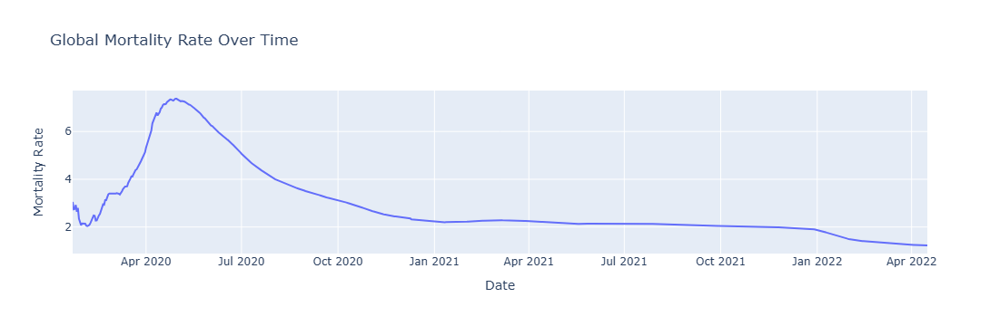

In [35]:
# Calculate mortality rate
df['Mortality_Rate'] = (df['Deaths'] / df['Confirmed']) * 100
global_daily = df.groupby('Date').sum().reset_index()
# Plotting mortality rate globally
global_daily['Mortality_Rate'] = (global_daily['Deaths'] / global_daily['Confirmed']) * 100

fig = px.line(global_daily, x='Date', y='Mortality_Rate',
             hover_data=['Recovered', 'Deaths'],
             title="Global Mortality Rate Over Time")
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Mortality Rate')
fig.show()


## Active cases overall worldwide

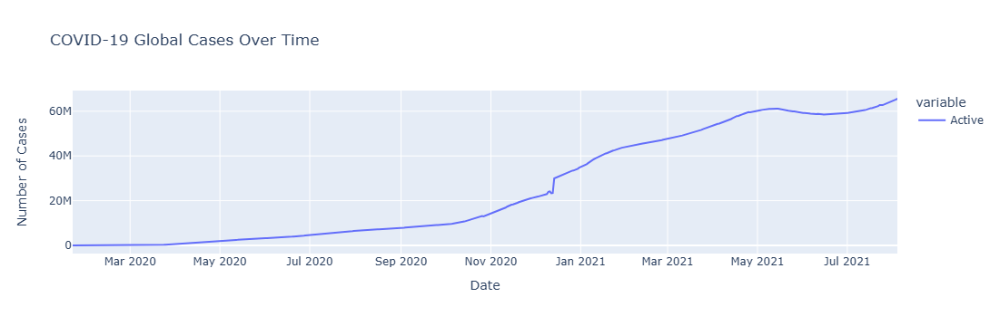

In [36]:
filtered_df = df[df['Date'] <= '2021-08-04']

# Calculate active cases
filtered_df['Active'] = filtered_df['Confirmed'] - filtered_df['Deaths'] - filtered_df['Recovered']

# Calculate daily sums
global_daily = filtered_df.groupby('Date').sum().reset_index()

# Calculate proportions
global_daily['Proportion_Active'] = global_daily['Active'] / global_daily['Confirmed']

# Create Plotly line plot
fig = px.line(global_daily, x='Date', y=['Active'], 
              title='COVID-19 Global Cases Over Time',
              labels={'value': 'Number of Cases', 'Date': 'Date'},
              line_shape='linear')

# Show the plot
fig.show()